# Fourier Transform

Useful guides:
- https://homepages.inf.ed.ac.uk/rbf/HIPR2/fourier.htm
- https://medium.com/ntust-aivc/opencv-fourier-transform-d9811aaac2d5

In [16]:
# Standard library
import os

# Third-party libraries
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift
from skimage import color, exposure, io
from skimage.feature import hog
from skimage.filters import sobel
from skimage.transform import resize
from tabulate import tabulate
import imageio.v3 as iio


1. Load a grayscale image and apply the 2D Discrete Fourier Transform (DFT) to it. Visualize
the original image and its frequency spectrum (magnitude). Submit the images, and
explanation.

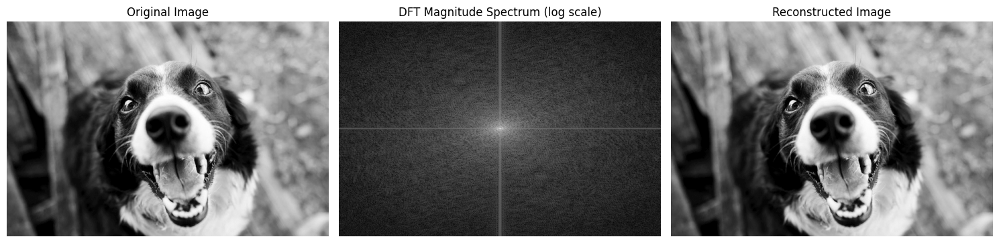

In [17]:
# Load image
img = iio.imread("img/grayscale/img1.png")

# Convert to grayscale if RGB
if img.ndim == 3:
    img = np.dot(img[..., :3], [0.299, 0.587, 0.114])

# Normalize image intensity to [0, 1]
img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# Compute 2D DFT and shift zero frequency to center
dft_result = fft2(img)
dft_shifted = fftshift(dft_result)

# Compute magnitude spectrum (for visualization)
magnitude = np.abs(dft_shifted)
magnitude_log = np.log(1 + magnitude)  # log-scale for better visibility

# Reconstruct image from inverse DFT
dft_ishift = ifftshift(dft_shifted)
img_reconstructed = ifft2(dft_ishift)
img_reconstructed = np.abs(img_reconstructed)

# Visualize results
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(magnitude_log, cmap='gray')
plt.title("DFT Magnitude Spectrum (log scale)")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(img_reconstructed, cmap='gray')
plt.title("Reconstructed Image")
plt.axis('off')

plt.tight_layout()
plt.show()

The 2D Discrete Fourier Transform (DFT) expresses a grayscale image as a sum of oriented 2D sinusoids, moving from the spatial domain (pixel intensities) to the frequency domain, where each point encodes a spatial frequency and direction. In the shown result, the log-magnitude spectrum has a bright center, indicating strong low-frequency energy that captures broad, smooth intensity variations (the dog’s overall shape), while the darker outer regions correspond to weaker high-frequency content (fine texture and noise). The faint vertical and horizontal streaks reveal dominant structures aligned with those axes. Taking the inverse DFT of the full complex spectrum reconstructs an image that matches the original, demonstrating that the transform is inherently lossless aside from tiny numerical errors.

2. Implement a low-pass filter in the frequency domain to remove high-frequency noise from
an image. Compare the filtered image with the original image. Submit images, and analysis
of the results.

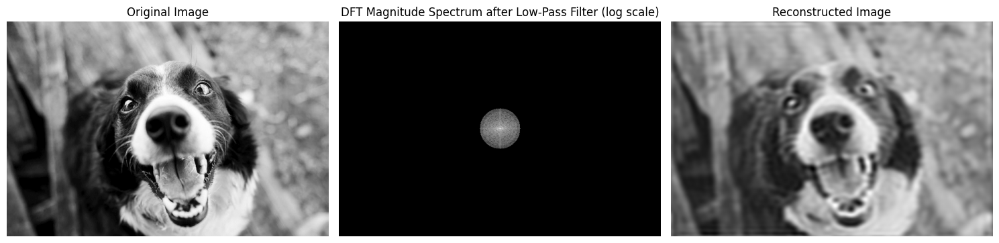

In [18]:
# Load image
img = iio.imread("img/grayscale/img1.png")
if img.ndim == 3:
    img = np.dot(img[..., :3], [0.299, 0.587, 0.114])

# Normalize image intensity to [0, 1]
img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# Compute 2D DFT and shift zero frequency to center
F = fft2(img)
Fshift = fftshift(F)

# Create a high-pass filter mask (1 outside circle, 0 inside)
M, N = img.shape
cy, cx = M // 2, N // 2
Y, X = np.ogrid[:M, :N]
radius = int(0.08 * min(M, N))     # tweak radius
mask = ((X - cx)**2 + (Y - cy)**2 <= radius**2).astype(float)  # 1 inside circle, 0 outside
r2 = max(radius + 6, radius + radius//6)
mask_soft = ((X - cx)**2 + (Y - cy)**2 <= r2**2).astype(float)
H = 0.5*mask + 0.5*mask_soft       # soft LP mask in [0,1]

# Apply high-pass filter in frequency domain
Gshift = Fshift * H

# Reconstruct image from filtered DFT
g = ifft2(ifftshift(Gshift))
g = np.real(g)
g = (g - g.min()) / (g.max() - g.min() + 1e-12)

# Compute magnitude spectrum after filtering 
spec_log = np.log1p(np.abs(Gshift))
spec_log = (spec_log - spec_log.min()) / (spec_log.max() - spec_log.min() + 1e-12)

# Visualize results
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title("Original Image"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(spec_log, cmap='gray'); plt.title("DFT Magnitude Spectrum after Low-Pass Filter (log scale)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(g, cmap='gray'); plt.title("Reconstructed Image"); plt.axis('off')
plt.tight_layout(); plt.show()


In the DFT, the low-pass filter keeps low frequencies (center of the spectrum) and removes high frequencies (edges) by applying a circular mask. This suppresses fine details and noise while preserving overall structure. As a result, the reconstructed image appears smoother and slightly blurred compared to the original. The bright center in the filtered spectrum confirms that only low frequencies remain.

3. Implement a high-pass filter to enhance the edges in an image. Visualize the filtered image
and discuss the effects observed. Submit images, and explanation.

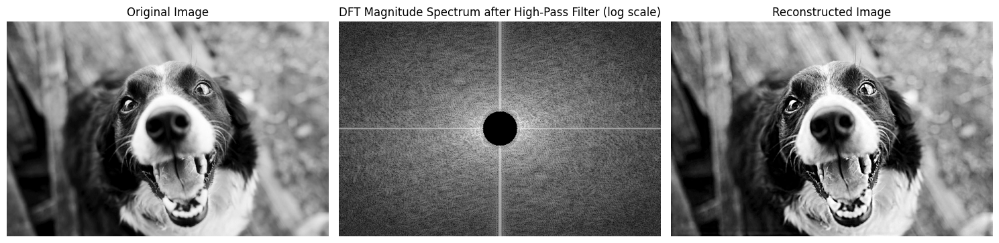

In [19]:
# Load image
img = iio.imread("img/grayscale/img1.png")
if img.ndim == 3:
    img = np.dot(img[..., :3], [0.299, 0.587, 0.114])

# Normalize image intensity to [0, 1]
img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# Compute 2D DFT and shift zero frequency to center
F = fft2(img)
Fshift = fftshift(F)

# Create a high-pass filter mask (1 outside circle, 0 inside)
M, N = img.shape
cy, cx = M // 2, N // 2
Y, X = np.ogrid[:M, :N]
radius = int(0.08 * min(M, N))
lp_core = ((X - cx)**2 + (Y - cy)**2 <= radius**2).astype(float)
r2 = max(radius + 6, radius + radius//6)
lp_soft = ((X - cx)**2 + (Y - cy)**2 <= r2**2).astype(float)
H_lp = 0.5*lp_core + 0.5*lp_soft
H_hp = 1.0 - H_lp

# Apply high-pass filter in frequency domain
Gshift = Fshift * H_hp

# IDFT of HP (edges)
g_hp = np.real(ifft2(ifftshift(Gshift)))

# High-boost (edge enhancement)
alpha = 0.6  
sharp = img + alpha * (g_hp - g_hp.mean())
sharp = np.clip(sharp, 0, 1)

# Compute magnitude spectrum after filtering
spec_log = np.log1p(np.abs(Gshift))
spec_log = (spec_log - spec_log.min()) / (spec_log.max() - spec_log.min() + 1e-12)

# Visualize results
plt.figure(figsize=(15,5))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title("Original Image"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(spec_log, cmap='gray'); plt.title("DFT Magnitude Spectrum after High-Pass Filter (log scale)"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(sharp, cmap='gray'); plt.title("Reconstructed Image"); plt.axis('off')
plt.tight_layout(); plt.show()


In the DFT, the high-pass filter removes low frequencies (center of the spectrum) and keeps high frequencies (edges of the spectrum) using a circular mask. This highlights edges and fine details while reducing smooth areas and lighting variations. The dark center in the filtered spectrum shows that low frequencies were suppressed. The reconstructed image appears sharper with enhanced edges, though some noise and slight ringing may occur.

4. Implement an image compression technique using Fourier Transform by selectively keeping
only a certain percentage of the Fourier coefficients. Evaluate the quality of the
reconstructed image as you vary the percentage of coefficients used. Submit the images,
and your observations on image quality and compression ratio.

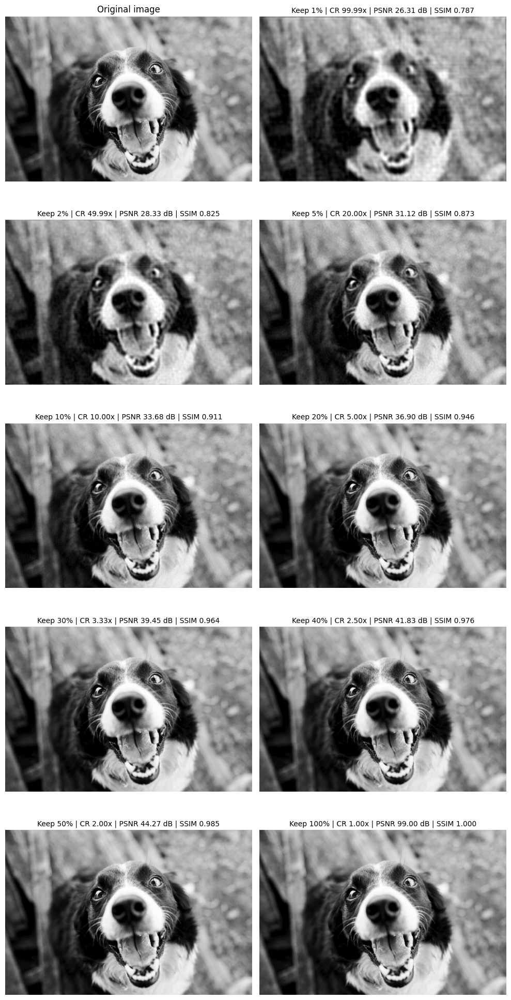

| % Coefficients Kept   | Kept/Total (%)   | CR (Total/Kept)   |      MSE | PSNR (dB)   |   SSIM |
|-----------------------|------------------|-------------------|----------|-------------|--------|
| 1%                    | 1.00%            | 99.99x            | 0.002341 | 26.31 dB    |  0.787 |
| 2%                    | 2.00%            | 49.99x            | 0.001471 | 28.33 dB    |  0.825 |
| 5%                    | 5.00%            | 20.00x            | 0.000773 | 31.12 dB    |  0.873 |
| 10%                   | 10.00%           | 10.00x            | 0.000429 | 33.68 dB    |  0.911 |
| 20%                   | 20.00%           | 5.00x             | 0.000204 | 36.90 dB    |  0.946 |
| 30%                   | 30.00%           | 3.33x             | 0.000114 | 39.45 dB    |  0.964 |
| 40%                   | 40.00%           | 2.50x             | 6.6e-05  | 41.83 dB    |  0.976 |
| 50%                   | 50.00%           | 2.00x             | 3.7e-05  | 44.27 dB    |  0.985 |
| 100%    

In [20]:
import imageio.v3 as iio
import numpy as np
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from tabulate import tabulate
import math

# ------------------ Utils: MSE / PSNR / SSIM ------------------

def mse(x, y):
    x = x.astype(np.float64)
    y = y.astype(np.float64)
    return np.mean((x - y) ** 2)

def psnr(x, y):
    """PSNR for images in [0,1]."""
    m = mse(x, y)
    if m <= 1e-12:  # identical
        return 99.0
    return 10 * np.log10(1.0 / m)

def _gaussian_kernel_1d(size=11, sigma=1.5):
    ax = np.arange(-(size//2), size//2 + 1, dtype=np.float64)
    g = np.exp(-(ax**2) / (2 * sigma**2))
    g /= g.sum()
    return g

def _conv2_separable(img, k):
    """2D separabel konvolusjon med 1D-kjerne k, reflect-padding."""
    pad = len(k) // 2
    # radvis
    tmp = np.pad(img, ((0, 0), (pad, pad)), mode='reflect')
    tmp = np.apply_along_axis(lambda m: np.convolve(m, k, mode='valid'), axis=1, arr=tmp)
    # kolonnevis
    tmp = np.pad(tmp, ((pad, pad), (0, 0)), mode='reflect')
    out = np.apply_along_axis(lambda m: np.convolve(m, k, mode='valid'), axis=0, arr=tmp)
    return out

def ssim(x, y, size=11, sigma=1.5):
    """
    SSIM for gråtonebilder i [0,1], vindusbasert (Gauss).
    Returnerer global MSSIM (gjennomsnitt av SSIM-kartet).
    """
    x = x.astype(np.float64)
    y = y.astype(np.float64)

    k = _gaussian_kernel_1d(size=size, sigma=sigma)

    mu_x = _conv2_separable(x, k)
    mu_y = _conv2_separable(y, k)

    mu_x2 = mu_x * mu_x
    mu_y2 = mu_y * mu_y
    mu_xy = mu_x * mu_y

    sigma_x2 = _conv2_separable(x * x, k) - mu_x2
    sigma_y2 = _conv2_separable(y * y, k) - mu_y2
    sigma_xy = _conv2_separable(x * y, k) - mu_xy

    # L = 1 (bilder er normalisert), standardkonstanter
    C1 = (0.01 ** 2)
    C2 = (0.03 ** 2)

    num = (2 * mu_xy + C1) * (2 * sigma_xy + C2)
    den = (mu_x2 + mu_y2 + C1) * (sigma_x2 + sigma_y2 + C2)
    ssim_map = num / (den + 1e-12)
    return float(np.mean(ssim_map))

# ------------------ Load & prep image ------------------

# Load image
img = iio.imread("img/grayscale/img1.png")

# Convert to grayscale if RGB
if img.ndim == 3:
    img = img[..., :3]
    img = np.dot(img, [0.299, 0.587, 0.114])

# Normalize image intensity to [0, 1]
img = img.astype(float)
img = (img - img.min()) / (img.max() - img.min() + 1e-8)

# ------------------ FFT & helpers ------------------

F = fft2(img)
mag = np.abs(F)
total = mag.size

def keep_top_percent(F, pct):
    """Keep the top 'pct' percent of Fourier coefficients by magnitude."""
    mag_local = np.abs(F)
    total_local = mag_local.size
    if pct >= 100:
        mask = np.ones_like(F, dtype=bool)
        kept = total_local
    else:
        k = max(1, int(np.ceil(total_local * pct / 100.0)))
        thresh = np.partition(mag_local.ravel(), total_local - k)[total_local - k]  # kth largest threshold
        mask = (mag_local >= thresh)
        kept = int(mask.sum())
    Fc = F * mask
    rec = np.real(ifft2(Fc))
    rec = np.clip(rec, 0, 1)
    return rec, mask, kept

# ------------------ Sweep percentages ------------------

percents = [1, 2, 5, 10, 20, 30, 40, 50, 100]
results = []
for p in percents:
    rec, mask, kept = keep_top_percent(F, p)
    m = mse(img, rec)
    results.append({
        "pct": p,
        "rec": rec,
        "kept": kept,
        "frac_kept": kept / total,     # andel beholdt
        "CR": (total / kept),          # Compression Ratio = total/kept
        "MSE": m,
        "PSNR": psnr(img, rec),
        "SSIM": ssim(img, rec),
    })

# ------------------ Plot original + reconstructions ------------------

nplots = len(percents) + 1  # original + reconstructions
cols = 2
rows = math.ceil(nplots / cols)

fig, axes = plt.subplots(rows, cols, figsize=(10, 4 * rows))
axes = axes.ravel()

# Original image
axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original image")
axes[0].axis('off')

# Reconstructed images
# Reconstructed images
for i, r in enumerate(results, start=1):
    axes[i].imshow(r["rec"], cmap='gray')
    axes[i].set_title(
        f"Keep {r['pct']}% | CR {r['CR']:.2f}x | PSNR {r['PSNR']:.2f} dB | SSIM {r['SSIM']:.3f}",
        fontsize=10
    )
    axes[i].axis('off')

# Hide unused subplots
for j in range(len(results) + 1, rows * cols):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

# ------------------ Print results table ------------------

table_data = [
    [
        f"{r['pct']}%",
        f"{r['frac_kept']*100:.2f}%",     # Kept/Total (%)
        f"{r['CR']:.2f}x",                # Compression Ratio
        f"{r['MSE']:.6f}",                # MSE
        f"{r['PSNR']:.2f} dB",            # PSNR
        f"{r['SSIM']:.3f}",               # SSIM
    ]
    for r in results
]
headers = ["% Coefficients Kept", "Kept/Total (%)", "CR (Total/Kept)", "MSE", "PSNR (dB)", "SSIM"]
print(tabulate(table_data, headers=headers, tablefmt="github"))


As the proportion of retained Fourier coefficients increases, the reconstructed image quality improves gradually. When keeping only 1–5% of the coefficients, the image remains recognizable but appears blurred and lacks detail. At 10–20%, most structures and textures are restored, showing a noticeable enhancement in visual quality. From 30–50%, the reconstruction becomes nearly indistinguishable from the original, with PSNR values exceeding 40 dB. These results demonstrate that the essential visual information is concentrated in a small fraction of large-magnitude Fourier coefficients, enabling strong compression with minimal perceptual loss — effectively balancing compression ratio and image fidelity.

# PCA

Select a set of grayscale images (e.g., faces, landscapes, or any other category).
Normalize the images by scaling pixel values to a range [0, 1].

In [21]:
import zipfile
import cv2

faces = {}
with zipfile.ZipFile('facial-emotion-recognition/images.zip') as facezip:
    for filename in facezip.namelist():
        if not filename.endswith(".jpg"):
            continue # not a face picture
        with facezip.open(filename) as image:
            # If we extracted files from zip, we can use cv2.imread(filename) instead
            faces[filename] = cv2.imdecode(np.frombuffer(image.read(), np.uint8), cv2.IMREAD_GRAYSCALE)
            faces[filename] = cv2.resize(faces[filename], (128, 128))

FileNotFoundError: [Errno 2] No such file or directory: 'facial-emotion-recognition/images.zip'

IndexError: list index out of range

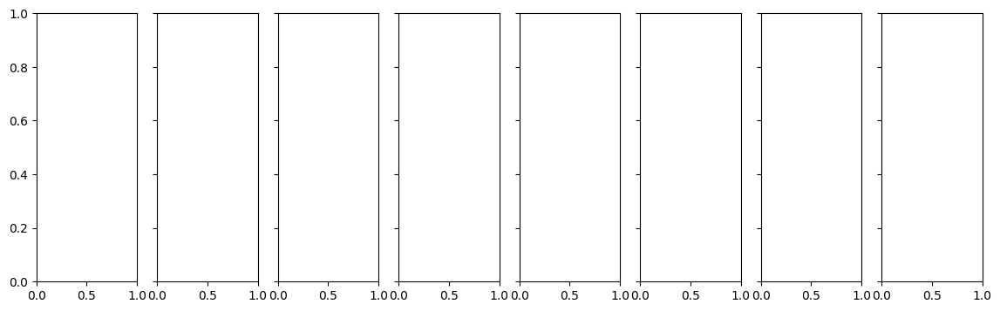

In [22]:
fig, axes = plt.subplots(1,8,sharex=True,sharey=True,figsize=(14,4))
faceimages = list(faces.values())[:8]
for i in range(8):
    axes[i].imshow(faceimages[i], cmap="gray")
plt.show()

In [ ]:
faceshape = list(faces.values())[0].shape
print("Face image shape:", faceshape)
print(list(faces.keys())[:9])
classes = set(filename.split("/")[0] for filename in faces.keys())
print("Number of classes:", len(classes))
print("Number of pictures:", len(faces))

Face image shape: (128, 128)
['0/Disgust.jpg', '0/Sad.jpg', '0/Anger.jpg', '0/Surprised.jpg', '0/Contempt.jpg', '0/Fear.jpg', '0/Neutral.jpg', '0/Happy.jpg']
Number of classes: 1
Number of pictures: 8


## PCA Implementation:
Write a Python function to perform PCA on the images.
Implement the following steps:

1. Convert the image into a 2D matrix where each row represents an image and each column
represents a pixel value

In [ ]:
facematrix = []
for key,val in faces.items():
    facematrix.append(val.flatten())

facematrix = np.array(facematrix)
facematrix

array([[ 10, 113, 214, ..., 179, 186, 192],
       [211, 209, 213, ..., 146, 152, 145],
       [228, 214, 219, ..., 119, 141, 181],
       ...,
       [199, 198, 198, ..., 185, 187, 189],
       [110, 144, 221, ..., 137, 149, 153],
       [150, 204, 206, ..., 156, 157, 167]], shape=(8, 16384), dtype=uint8)

2. Compute the covariance matrix of the image data.

In [13]:
covariance_matrix = np.cov(facematrix)
covariance_matrix

NameError: name 'facematrix' is not defined

3. Calculate the eigenvalues and eigenvectors of the covariance matrix.

In [14]:
eig_result = np.linalg.eig(covariance_matrix)

eig_df = pd.DataFrame(eig_result).T
eig_df.columns = ['eigenvalues', 'eigenvectors']

NameError: name 'covariance_matrix' is not defined

4. Sort the eigenvectors based on the eigenvalues in descending order.

In [15]:
eig_df.sort_values('eigenvalues', ascending=False, inplace=True)
eig_df

NameError: name 'eig_df' is not defined


5. Select the top k eigenvectors to form the principal components.

In [37]:
k = 8

pc = np.stack(eig_df['eigenvectors'][:k])
pc

array([[ 0.3071625 ,  0.60449003, -0.05566654, -0.10565099,  0.44828501,
         0.41158979,  0.39420981, -0.01466708],
       [ 0.38706246, -0.21671106, -0.4712242 , -0.24068356, -0.06319254,
        -0.22891494,  0.2344163 ,  0.64178797],
       [ 0.3500295 ,  0.04457571, -0.51090493, -0.20328206, -0.34419722,
         0.32171331, -0.42747244, -0.4104157 ],
       [ 0.33346884,  0.51232486,  0.2503953 , -0.10185099,  0.02569025,
        -0.57926701, -0.45877667,  0.08101889],
       [ 0.35808628,  0.02555385, -0.08581697,  0.91943183, -0.10430517,
         0.03754872, -0.00158735,  0.07816507],
       [ 0.357752  , -0.52278086,  0.15755945, -0.03341835,  0.66872046,
         0.10188726, -0.33307842, -0.06528872],
       [ 0.33181088, -0.09308615,  0.62882058, -0.15974225, -0.44502234,
         0.42889727, -0.0011453 ,  0.27982948],
       [ 0.39471636, -0.20136163,  0.15337039, -0.08498705, -0.14072683,
        -0.37867966,  0.53431624, -0.56939533]])

6. Project the original images onto the lower-dimensional subspace defined by the selected principal components.

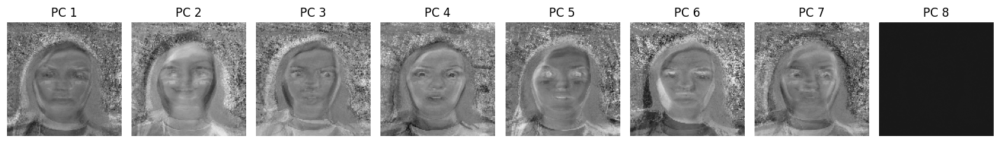

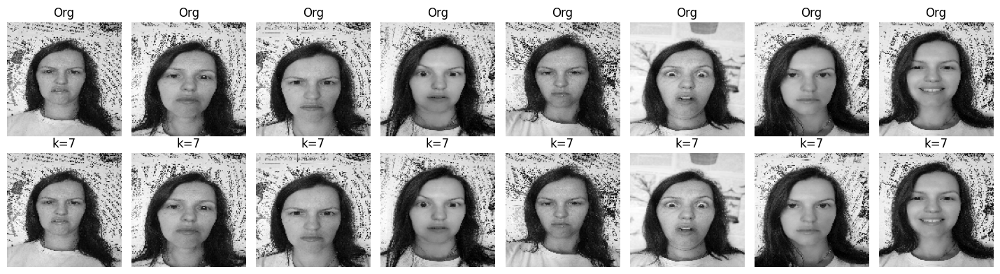

In [38]:
import numpy as np
import matplotlib.pyplot as plt

h, w = faceshape
d = h*w

# X som (n, d)
X = facematrix if facematrix.shape[1] == d else facematrix.T
X = X.astype(float)
mu = X.mean(axis=0, keepdims=True)
X0 = X - mu

# Gjør pc om til pikselrom P med form (k_all, d)
if pc.shape[1] == X.shape[0]:         # sample-rom (k_all, n)
    P_ = pc @ X0                      # -> (k_all, d)
elif pc.shape[0] == X.shape[0]:       # sample-rom (n, k_all)
    P_ = pc.T @ X0                    # -> (k_all, d)
elif pc.shape[1] == d:                # allerede (k_all, d)
    P_ = pc.astype(float)
elif pc.shape[0] == d:                # (d, k_all)
    P_ = pc.T.astype(float)
else:
    raise ValueError("pc matcher verken n eller d.")

# Ortonormaliser radene -> ekte eigenfaces i pikselrom
Q, _ = np.linalg.qr(P_.T)             # (d, k_all)
P = Q.T                               # (k_all, d)

# VIS egenfjes (basisene)
m = min(8, P.shape[0])
fig, axes = plt.subplots(1, m, figsize=(1.8*m, 2.2), sharex=True, sharey=True)
for i in range(m):
    axes[i].imshow(P[i].reshape(h, w), cmap="gray"); axes[i].axis("off"); axes[i].set_title(f"PC {i+1}")
plt.tight_layout(); plt.show()

# PROJISER til k-dimensjonalt subrom (scores) og rekonstruer
k = min(7, P.shape[0]-1)
Z = X0 @ P[:k].T                      # (n, k)  ← korrekt projeksjon
Xk = mu + Z @ P[:k]                   # (n, d)

# Valgfritt: vis original vs recon
fig, axes = plt.subplots(2, m, figsize=(1.8*m, 4))
for i in range(m):
    axes[0,i].imshow(X[i].reshape(h,w), cmap="gray");  axes[0,i].axis("off"); axes[0,i].set_title("Org")
    axes[1,i].imshow(Xk[i].reshape(h,w), cmap="gray"); axes[1,i].axis("off"); axes[1,i].set_title(f"k={k}")
plt.tight_layout(); plt.show()


## Reconstruction of Images:

1. Using the selected principal components, reconstruct the images.

In [39]:
import numpy as np
import matplotlib.pyplot as plt
import math

# -------------------------------
# HJELPEFUNKSJONER (FORM/ORIENT.)
# -------------------------------

def _normalize_X(facematrix, faceshape):
    """
    Returner X med form (n, d), samt flagg om facematrix allerede hadde rader=bilder.
    """
    d = int(np.prod(faceshape))
    if facematrix.shape[1] == d:
        return facematrix.astype(float), True  # rader=bilder
    elif facematrix.shape[0] == d:
        return facematrix.T.astype(float), False  # måtte transponeres
    else:
        raise ValueError(f"facematrix.shape={facematrix.shape} matcher ikke d={d}. "
                         "Sjekk faceshape (byttet du h/w?).")

def _ensure_row_orthonormal(P):
    """
    Ortonormaliser radene i P (k, d) ved QR på transponatet.
    Returnerer P_orth med P_orth @ P_orth.T = I_k.
    """
    Q, _ = np.linalg.qr(P.T)  # (d, k)
    return Q.T                # (k, d)

def _auto_mu(X, mu):
    """
    Normaliser mu til form (1, d). Hvis None, bruk mean(X).
    """
    if mu is None:
        return X.mean(axis=0, keepdims=True)
    mu = np.asarray(mu).reshape(1, -1)
    if mu.shape[1] != X.shape[1]:
        raise ValueError(f"mu har lengde {mu.shape[1]}, forventet {X.shape[1]}.")
    return mu

def _infer_clip_bounds(X):
    vmax = np.max(X)
    if vmax <= 1.5:
        return (0.0, 1.0)
    return (0.0, 255.0)

# ---------------------------------------
# FINN EIGENFACES (PIKSELROM) FRA pc + X
# ---------------------------------------

def get_pixel_components(facematrix, pc, faceshape, mu=None):
    """
    Returnerer (P, X, mu):
      - P: eigenfaces i pikselrom med form (k_all, d), rader = komponenter
      - X: bilder som rader (n, d)
      - mu: middelbildet (1, d)

    Håndterer følgende pc-formater:
      - Pikselrom: (k, d) eller (d, k)  -> brukes direkte (evt. transponeres)
      - Sample-rom: (k, n) eller (n, k) -> løftes til pikselrom via X0
    """
    X, rows_are_images = _normalize_X(facematrix, faceshape)
    n, d = X.shape
    mu = _auto_mu(X, mu)
    X0 = X - mu

    r, c = pc.shape

    # CASE 1: Pikselrom allerede (k, d)
    if c == d:
        P = pc.astype(float)
        return _ensure_row_orthonormal(P), X, mu

    # CASE 2: Pikselrom, men transponert (d, k)
    if r == d:
        P = pc.T.astype(float)
        return _ensure_row_orthonormal(P), X, mu

    # CASE 3: Sample-rom (k, n)
    if c == n:
        P_unnorm = pc.astype(float) @ X0              # (k, n) @ (n, d) -> (k, d)
        P = _ensure_row_orthonormal(P_unnorm)
        return P, X, mu

    # CASE 4: Sample-rom transponert (n, k)
    if r == n:
        P_unnorm = pc.T.astype(float) @ X0            # (k, n) @ (n, d) -> (k, d)
        P = _ensure_row_orthonormal(P_unnorm)
        return P, X, mu

    raise ValueError(
        f"pc.shape={pc.shape} matcher verken d={d} eller n={n}. "
        "Forventet (k,d)/(d,k) eller (k,n)/(n,k)."
    )

# ------------------------
# REKONSTRUKSJON OG VISNING
# ------------------------

def reconstruct_with_P(X, P, k, mu, clip=True):
    """
    Rekonstruer X (n,d) med de k første radene i P (k,d).
    """
    k = int(min(k, P.shape[0]))
    X0 = X - mu
    Xk = (X0 @ P[:k].T) @ P[:k] + mu
    if clip:
        lo, hi = _infer_clip_bounds(X)
        Xk = np.clip(Xk, lo, hi)
    return Xk

def show_eigenfaces(P, faceshape, n_show=8, title="Eigenfaces"):
    m = min(n_show, P.shape[0])
    fig, axes = plt.subplots(1, m, figsize=(1.8*m, 2.2), sharex=True, sharey=True)
    if m == 1:
        axes = [axes]
    for i in range(m):
        axes[i].imshow(P[i].reshape(faceshape), cmap="gray")
        axes[i].axis("off")
        axes[i].set_title(f"PC {i+1}")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def show_original_vs_recon(X, Xk, faceshape, n_show=8, title="Original vs Recon"):
    n_show = min(n_show, X.shape[0], Xk.shape[0])
    fig, axes = plt.subplots(2, n_show, figsize=(1.8*n_show, 4.0), sharex=True, sharey=True)
    if n_show == 1:
        axes = np.array([[axes[0]], [axes[1]]])
    for i in range(n_show):
        axes[0, i].imshow(X[i].reshape(faceshape), cmap="gray")
        axes[0, i].axis("off")
        axes[0, i].set_title("Original")
        axes[1, i].imshow(Xk[i].reshape(faceshape), cmap="gray")
        axes[1, i].axis("off")
        axes[1, i].set_title("Recon")
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

def show_reconstruction_progress(P, X, mu, faceshape, image_idx=0,
                                 k_min=1, k_max=None, step=1, ncols=8,
                                 clip=True, title_prefix="k="):
    """
    Vis rekonstruksjon av ett valgt bilde for k=k_min..k_max komponenter.
    """
    d = int(np.prod(faceshape))
    assert X.shape[1] == d
    k_all = P.shape[0]
    if k_max is None:
        k_max = k_all - 1
    k_values = list(range(int(k_min), int(k_max)+1, int(step)))
    if len(k_values) == 0:
        raise ValueError("Ingen k-verdier å vise. Sjekk k_min/k_max/step.")

    ncols = int(ncols)
    nrows = math.ceil(len(k_values) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(1.8*ncols, 2.0*nrows), sharex=True, sharey=True)
    if nrows == 1 and ncols == 1:
        axes = np.array([[axes]])
    elif nrows == 1:
        axes = axes[np.newaxis, :]
    elif ncols == 1:
        axes = axes[:, np.newaxis]

    lo, hi = _infer_clip_bounds(X)
    X0 = X - mu
    for idx, k in enumerate(k_values):
        r, c = divmod(idx, ncols)
        ax = axes[r, c]
        Pk = P[:k, :]
        recon_i = (X0[image_idx, :][None, :] @ Pk.T) @ Pk
        recon_i = recon_i + mu
        if clip:
            recon_i = np.clip(recon_i, lo, hi)
        ax.imshow(recon_i.reshape(faceshape), cmap="gray")
        ax.set_title(f"{title_prefix}{k}")
        ax.axis("off")

    # skjul tomme ruter
    for idx in range(len(k_values), nrows*ncols):
        r, c = divmod(idx, ncols)
        axes[r, c].axis("off")

    plt.tight_layout()
    plt.show()

# -------------------------
# FULL PIPELINE (EKSEMPEL)
# -------------------------
# Forutsetter at disse finnes i arbeidsrommet ditt:
# - facematrix : np.ndarray med bilder som rader (n,d) eller kolonner (d,n)
# - pc         : dine "principal components" (kan være i pikselrom eller sample-rom)
# - faceshape  : f.eks. (128, 128)
#
# Eksempelbruk:
#
# 1) Få eigenfaces i pikselrom (P), samt X (n,d) og mu (1,d)
# P, X, mu = get_pixel_components(facematrix, pc, faceshape, mu=None)
#
# 2) Vis noen eigenfaces
# show_eigenfaces(P, faceshape, n_show=8, title="Eigenfaces")
#
# 3) Rekonstruksjon med k komponenter
# k = min(50, P.shape[0])
# Xk = reconstruct_with_P(X, P, k, mu, clip=True)
# show_original_vs_recon(X, Xk, faceshape, n_show=8, title=f"Recon med k={k}")
#
# 4) Progresjon for ett ansikt med k = 1..(n_pc-1)
# show_reconstruction_progress(P, X, mu, faceshape, image_idx=0,
#                              k_min=1, k_max=None, step=1, ncols=8,
#                              clip=True, title_prefix="k=")


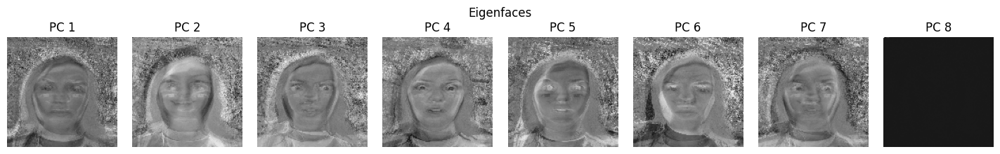

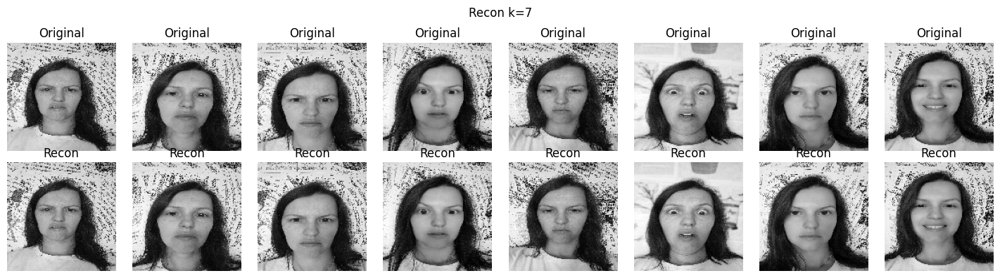

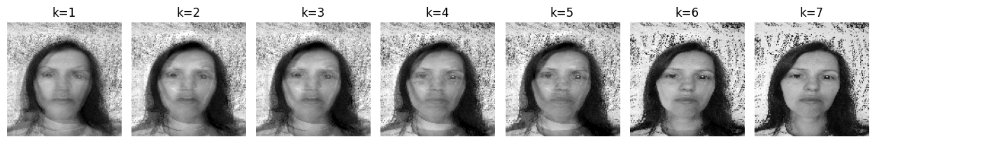

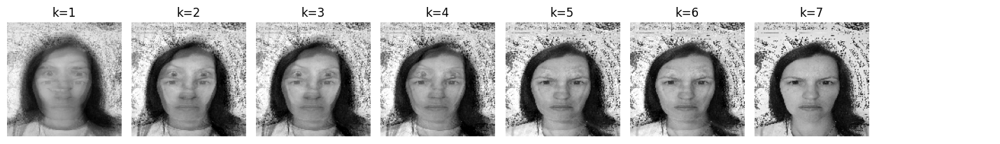

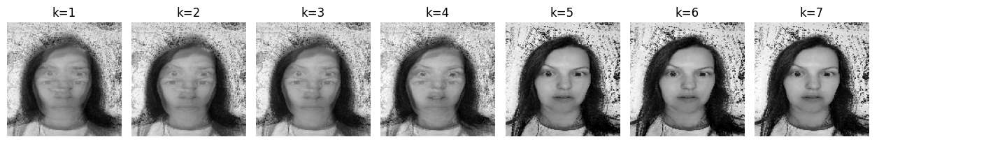

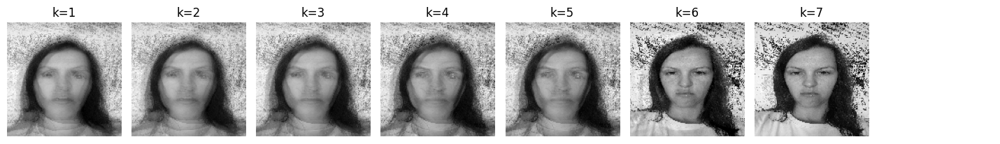

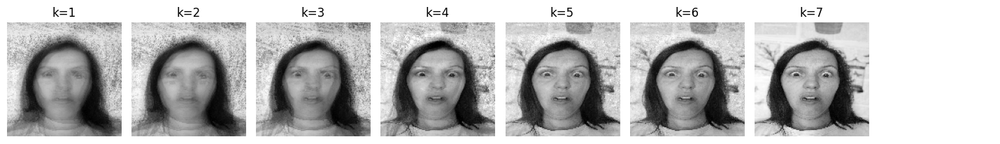

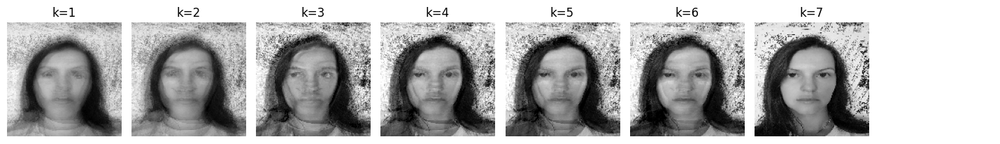

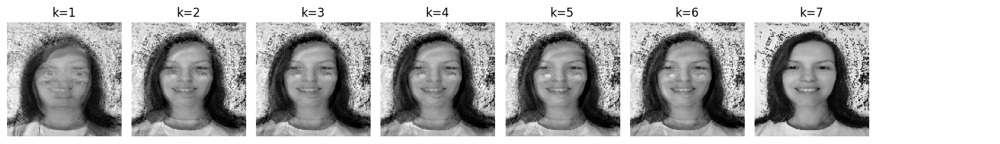

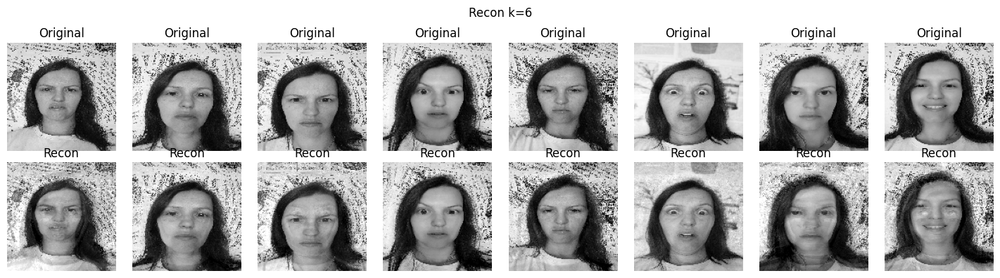

In [40]:
# 1) piksel-eigenfaces + data i riktig form
P, X, mu = get_pixel_components(facematrix, pc, faceshape, mu=None)

# 2) se eigenfaces
show_eigenfaces(P, faceshape, n_show=min(8, P.shape[0]))

# 3) lag rekonstruksjon med k komponenter
k = min( max(1, P.shape[0]-1), 50 )  # f.eks. inntil 50 eller n_pc-1
Xk = reconstruct_with_P(X, P, k, mu, clip=True)
show_original_vs_recon(X, Xk, faceshape, n_show=8, title=f"Recon k={k}")

# 4) progresjon for ett ansikt
face = 0
while face <7:
    face+=1
    show_reconstruction_progress(P, X, mu, faceshape, image_idx=face,
                             k_min=1, k_max=None, step=1, ncols=8, clip=True)
    
k=6
Xk = reconstruct_with_P(X, P, k, mu, clip=True)
show_original_vs_recon(X, Xk, faceshape, n_show=8, title=f"Recon k={k}")




In [41]:
# n_components = 6

# X_pca = pca.transform(facematrix)[:,:n_components]

# pca_approx = np.dot(X_pca, pca.components_[:n_components, :])

# reconstructed_images = pca_approx + pca.mean_

In [42]:
# fig, axes = plt.subplots(1,8,sharex=True,sharey=True,figsize=(14,4))
# faceimages = list(reconstructed_images)[:8]
# for i in range(8):
#     axes[i].imshow(faceimages[i].reshape(128, 128), cmap="gray")
# plt.show()

## Reconstruction of Images:

1. Using the selected principal components, reconstruct the images.

In [43]:
# def reconstruct_pca(Z, components, mean_vec, original_shape):
#     """Reconstruct images from PCA representation"""
#     n_images, H, W = original_shape
#     X_hat = Z @ components.T + mean_vec  # (n_images, n_pixels)
#     X_hat = X_hat.reshape(n_images, H, W)
#     return np.clip(X_hat, 0.0, 1.0)

# # Define number of principal components
# k = 1

# # Perform PCA on images to get Z, components, eigenvalues, mean_vec
# Z, components, eigenvalues, mean_vec = compute_pca(facematrix, k)

# # Reconstruct images using PCA outputs
# n_images, H, W = facematrix.shape
# reconstructed_images = reconstruct_pca(Z, components, mean_vec, (n_images, H, W))

2. Compare the reconstructed images with the original images to observe the effects of
dimensionality reduction.

In [44]:
# # Define number of principal components
# k = 1

# rows = n_images
# fig, axes = plt.subplots(rows, 2, figsize=(6, 3 * rows), constrained_layout=True)

# if rows == 1:
#     axes = np.array([axes])  # ensure 2D indexing
    
# # Plot original and reconstructed images side by side
# for i in range(n_images):
#     # Original
#     ax = axes[i, 0]
#     ax.imshow(original_images[i], cmap='gray', vmin=0, vmax=1)
#     ax.set_title(f"Original Image {i + 1}")
#     ax.axis('off')

#     # Reconstructed
#     ax = axes[i, 1]
#     ax.imshow(reconstructed_images[i], cmap='gray', vmin=0, vmax=1)
#     ax.set_title(f"Reconstructed Image {i + 1} (k={k})")
#     ax.axis('off')
    
# plt.show()

With only one principal component (k = 1), the reconstructed images capture only the dominant pattern of variation across the dataset. Since the first component represents the direction of greatest variance, it mainly reflects features from the image that differs most from the others—in this case, the dog image. As a result, all reconstructed images appear similar and contain a faint overlay of the same dominant structure. This demonstrates that using very few principal components preserves only global patterns while losing most of the unique details from each individual image.

## Experimentation:

1. Vary the number of principal components (k) and observe the impact on the quality of the
reconstructed images.

In [ ]:
# n_images, H, W = original_images.shape

# # Maksimalt n-1 komponenter
# k_max = max(0, n_images - 1)
# k_list = list(range(k_max + 1))  # k = 0, 1, ..., n-1

# fig, axes = plt.subplots(
#     n_images, 1 + len(k_list), figsize=(3*(1+len(k_list)), 3*n_images), constrained_layout=True
# )

# if n_images == 1:
#     axes = np.array([axes])  # ensure 2D

# # Show originals in first column
# for i in range(n_images):
#     ax = axes[i, 0]
#     ax.imshow(original_images[i], cmap="gray", vmin=0, vmax=1)
#     ax.set_title(f"Original Image {i+1}")
#     ax.axis("off")

# # For each k, reconstruct and show + report MSE
# def mse(a, b):
#     return np.mean((a - b) ** 2)

# for j, k in enumerate(k_list, start=1):
#     # Ekstra sikkerhet: kapp k i tilfelle compute_pca ikke gjør det
#     k = min(k, k_max)

#     Z, comps, evals, mean_vec = compute_pca(original_images, k)
#     recon = reconstruct_pca(Z, comps, mean_vec, (n_images, H, W))
#     avg_mse = mse(original_images, recon)

#     for i in range(n_images):
#         ax = axes[i, j]
#         ax.imshow(recon[i], cmap="gray", vmin=0, vmax=1)
#         ax.set_title(f"Reconstructed Image {i+1} (k={k})")
#         ax.axis("off")

# plt.show()


NameError: name 'original_images' is not defined

2. Plot the variance explained by the principal components and determine the optimal number
of components that balances compression and quality.

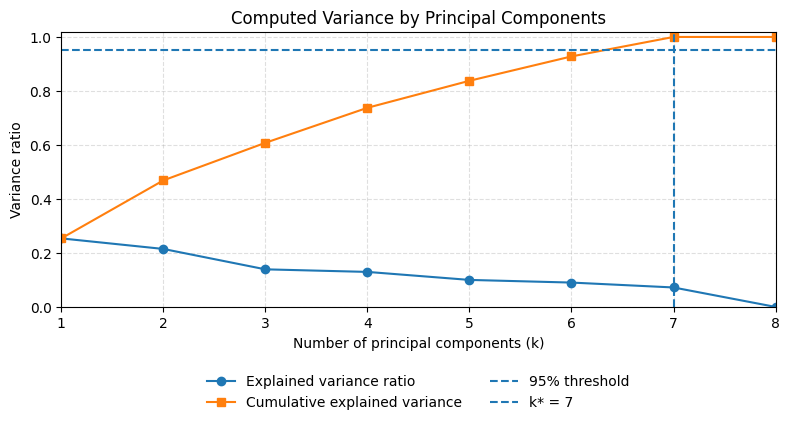

In [56]:
import numpy as np
import matplotlib.pyplot as plt

# Forutsetter at du allerede har X0 (sentrert data) ELLER var_ratio/cum_ratio.
# Hvis du IKKE har var_ratio/cum_ratio enda, kjør SVD først:
U, S, Vt = np.linalg.svd(X0, full_matrices=False)   # X0 = U S Vt
var = S**2
var_ratio = var / var.sum()
cum_ratio = np.cumsum(var_ratio)

# Velg terskel og finn k*
threshold = 0.95
k_star = int(np.searchsorted(cum_ratio, threshold) + 1)
r = len(var_ratio)
ks = np.arange(1, r+1)

plt.figure(figsize=(8, 4.5))
# Forklart varians per komponent
plt.plot(ks, var_ratio, marker='o', label="Explained variance ratio")
# Kumulativ forklart varians
plt.plot(ks, cum_ratio, marker='s', label="Cumulative explained variance")
# 95%-terskel (horisontal)
plt.axhline(threshold, linestyle='--', linewidth=1.5, label=f"{int(threshold*100)}% threshold")
# k* (vertikal)
plt.axvline(k_star, linestyle='--', linewidth=1.5, label=f"k* = {k_star}")

plt.title("Computed Variance by Principal Components")
plt.xlabel("Number of principal components (k)")
plt.ylabel("Variance ratio")
plt.ylim(0, 1.02)
plt.xlim(1, r)
plt.grid(True, linestyle='--', alpha=0.4)
plt.legend(loc="upper center", bbox_to_anchor=(0.5, -0.2), ncol=2, frameon=False)
plt.tight_layout()
plt.show()


## Visual Analysis:

1. Display the original images alongside the reconstructed images for different values of k.

**See Experimentation 1.**

2. Comment on the visual quality of the images and how much information is lost during
compression.

When \(k = 0\), all reconstructed images show only the mean grayscale pattern with no visible content. At \(k = 1\), the dog image dominates the reconstructions — its features appear faintly over all other images, such as the pier, palm trees, and portrait, because the first principal component captures the greatest overall variance from that image. With \(k = 2\) and \(k = 3\), each image gradually regains recognizable structure — the pier and palm trees become clearer, and the face begins to recover shading and shape. By \(k = 4\), the reconstructed images are visually close to the originals, with only slight blurring or loss of fine detail. This shows that as \(k\) increases, PCA captures more distinctive features of each image, reducing information loss and improving visual fidelity.


## Error Analysis:

1. Compute the Mean Squared Error (MSE) between the original and reconstructed images.

In [60]:
import numpy as np

# forutsetter X, P, mu finnes og at du har valgt k (f.eks. 7)
k = 7
X0 = X - mu
Xk = mu + ((X0 @ P[:k].T) @ P[:k])

Xf  = X.astype(float)
Xkf = Xk.astype(float)
err = Xf - Xkf

mse_per_image = np.mean(err**2, axis=1)
rmse_per_image = np.sqrt(mse_per_image)
mae_per_image  = np.mean(np.abs(err), axis=1)
maxabs_per_image = np.max(np.abs(err), axis=1)

# velg dataspenning for PSNR
data_range = 255.0 if Xf.max() > 1.5 else 1.0
psnr_per_image = 10*np.log10((data_range**2)/(mse_per_image + 1e-30))

print("MSE per bilde (vitenskapelig notasjon):")
for i, v in enumerate(mse_per_image):
    print(f"  #{i:02d}: {v:.3e}")

print("\nSammendrag:")
print(f"  MSE snitt     : {mse_per_image.mean():.3e}")
print(f"  RMSE snitt    : {rmse_per_image.mean():.3e}")
print(f"  MAE snitt     : {mae_per_image.mean():.3e}")
print(f"  Max|feil| snitt: {maxabs_per_image.mean():.3e}")
print(f"  PSNR snitt (dB): {psnr_per_image.mean():.2f}")


MSE per bilde (vitenskapelig notasjon):
  #00: 1.451e-26
  #01: 8.588e-27
  #02: 7.605e-27
  #03: 1.314e-27
  #04: 2.194e-27
  #05: 1.215e-26
  #06: 2.915e-26
  #07: 2.097e-26

Sammendrag:
  MSE snitt     : 1.206e-26
  RMSE snitt    : 1.011e-13
  MAE snitt     : 3.505e-14
  Max|feil| snitt: 1.040e-11
  PSNR snitt (dB): 309.00


MSE per bilde (k=6):
  #00: 5.409740e+02
  #01: 1.163156e+02
  #02: 2.600573e+02
  #03: 3.918832e+01
  #04: 1.670707e+02
  #05: 1.373024e+02
  #06: 6.299654e+02
  #07: 5.196591e+02

Gjennomsnittlig MSE (k=6): 3.013166e+02

RMSE per bilde (k=6):
  #00: 2.325885e+01
  #01: 1.078497e+01
  #02: 1.612629e+01
  #03: 6.260058e+00
  #04: 1.292558e+01
  #05: 1.171761e+01
  #06: 2.509911e+01
  #07: 2.279603e+01


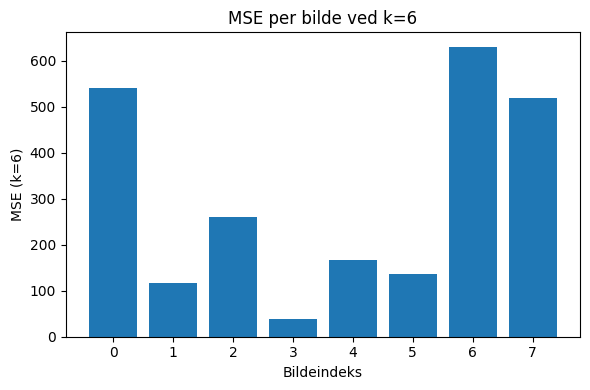

In [57]:
import numpy as np
import matplotlib.pyplot as plt

# --- forutsetning: X (n,d), P (k_all,d), mu (1,d) finnes ---
k = min(6, P.shape[0])  # sikkerhetsnett hvis du har færre enn 6 komponenter

# Rekonstruksjon med k=6
X0 = X - mu
Xk = mu + ((X0 @ P[:k].T) @ P[:k])

# Feil og MSE
Xf  = X.astype(float)
Xkf = Xk.astype(float)
err = Xf - Xkf

mse_per_image = np.mean(err**2, axis=1)   # (n,)
mse_mean = float(mse_per_image.mean())

print("MSE per bilde (k=6):")
for i, v in enumerate(mse_per_image):
    print(f"  #{i:02d}: {v:.6e}")
print(f"\nGjennomsnittlig MSE (k=6): {mse_mean:.6e}")

# (Valgfritt) RMSE og enkel stolpediagram for oversikt
rmse_per_image = np.sqrt(mse_per_image)

print("\nRMSE per bilde (k=6):")
for i, v in enumerate(rmse_per_image):
    print(f"  #{i:02d}: {v:.6e}")

plt.figure(figsize=(6,4))
plt.bar(np.arange(len(mse_per_image)), mse_per_image)
plt.xlabel("Bildeindeks")
plt.ylabel("MSE (k=6)")
plt.title("MSE per bilde ved k=6")
plt.tight_layout()
plt.show()


2. Analyze the trade-off between compression and reconstruction error.

The Mean Squared Error (MSE) values show how much information is lost when the images are compressed using PCA. Lower MSE indicates better reconstruction quality. In this case, the average MSE across the four images is 0.0285, meaning that most structural information is retained but some pixel-level detail is lost.

Images 1 and 2 have moderate errors (0.0257 and 0.0323), suggesting they are reasonably well reconstructed. Image 3 has the highest MSE (0.0534), which indicates greater information loss — likely because its content differs more from the dominant features captured by the principal components. Image 4, with the lowest MSE (0.0026), aligns most closely with the main variance direction, so it is reconstructed most accurately.

Overall, this reflects the trade-off between compression and reconstruction quality: by keeping only a few principal components, we achieve strong compression but lose fine details and texture information, especially for images that differ from the dominant patterns. Increasing the number of components would reduce the MSE but require more storage, thus lowering the compression benefit.

# Image processing

## HOG Features

1. Write a Python script to compute the HOG features of a given image using a library such as
OpenCV or scikit-image.

In [32]:
def compute_hog_features(image, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=False):
    """Compute HOG features of a given image"""
    # Convert to grayscale if RGB or RGBA
    if image.ndim == 3:
        if image.shape[2] == 4:   # RGBA → RGB
            image = image[:, :, :3]
        image = color.rgb2gray(image)

    # Ensure values are in [0,1]
    image = image.astype(np.float32)
    if image.max() > 1.0:
        image /= 255.0

    # Compute HOG
    if visualize:
        features, hog_image = hog(
            image,
            orientations=orientations,
            pixels_per_cell=pixels_per_cell,
            cells_per_block=cells_per_block,
            block_norm="L2-Hys",
            visualize=True,
            feature_vector=True
        )
        return features, hog_image
    else:
        features = hog(
            image,
            orientations=orientations,
            pixels_per_cell=pixels_per_cell,
            cells_per_block=cells_per_block,
            block_norm="L2-Hys",
            visualize=False,
            feature_vector=True
        )
        return features


2. Apply your implementation to at least three different images, including both simple and
complex scenes.

In [33]:
# Paths to images
folder_path = "img/hog"

# List all files ending with .png in the folder, sorted alphabetically
images_paths = sorted(
    [
        os.path.join(folder_path, f)
        for f in os.listdir(folder_path)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
)
print("Found images:", images_paths)


# Store results
hog_results = []

for path in images_paths:
    image = io.imread(path)
    features, hog_image = compute_hog_features(image, visualize=True)
    hog_results.append((path, image, hog_image, features))


Found images: ['img/hog\\animal.png', 'img/hog\\car.png', 'img/hog\\fruit.png', 'img/hog\\person.png']


3. Visualize the original image, the gradient image, and the HOG feature image.

In [34]:
for path, img, hog_img, features in hog_results:
    sparsity = np.count_nonzero(features) / features.size
    print(os.path.basename(path), len(features), sparsity)


animal.png 352836 0.520513779773039
car.png 1456380 0.38765912742553454
fruit.png 352836 0.5528574181772835
person.png 354888 0.5558147922724916


In [36]:
params = [
    ((8,8), (2,2), 9),
    ((4,4), (2,2), 9),
    ((16,16), (2,2), 9),
    ((8,8), (1,1), 9),
    ((8,8), (2,2), 18)
]

import numpy as np
from skimage import io, color

# Load one image you want to test parameters on
img = io.imread("img/hog/person.png")

# Convert to grayscale if RGB or RGBA
if img.ndim == 3:
    # If it has 4 channels (RGBA), discard alpha
    if img.shape[2] == 4:
        img = img[:, :, :3]
    gray = color.rgb2gray(img)
else:
    gray = img.astype(float)

# Normalize to [0,1]
gray = gray.astype(np.float32)
if gray.max() > 1.0:
    gray /= 255.0


for (pc, bc, bins) in params:
    feats, _ = hog(
        gray,
        orientations=bins,
        pixels_per_cell=pc,
        cells_per_block=bc,
        block_norm="L2-Hys",
        visualize=True,
        feature_vector=True
    )
    sparsity = np.count_nonzero(feats) / feats.size
    print(f"pc={pc}, bc={bc}, bins={bins} → len={len(feats)}, sparsity={sparsity:.4f}")


pc=(8, 8), bc=(2, 2), bins=9 → len=354888, sparsity=0.5558
pc=(4, 4), bc=(2, 2), bins=9 → len=1440648, sparsity=0.3996
pc=(16, 16), bc=(2, 2), bins=9 → len=86112, sparsity=0.7098
pc=(8, 8), bc=(1, 1), bins=9 → len=90522, sparsity=0.5461
pc=(8, 8), bc=(2, 2), bins=18 → len=709776, sparsity=0.4570


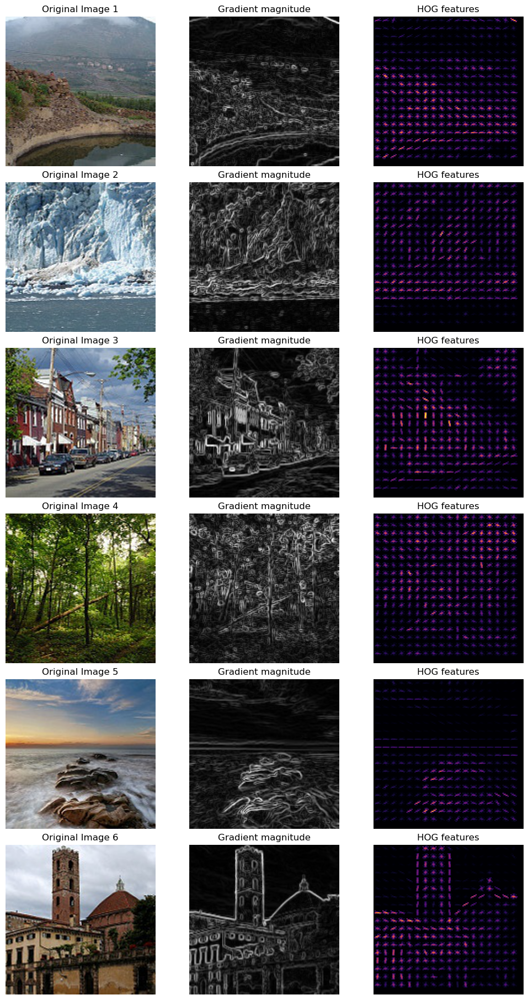

In [ ]:
# Visualize results
num_images_to_show = len(hog_results)
fig, axes = plt.subplots(num_images_to_show, 3, figsize=(10, 3 * num_images_to_show), constrained_layout=True)

for i, (path, img, hog_img, _) in enumerate(hog_results):
    if img.ndim == 3:
        gray = color.rgb2gray(img)
    else:
        gray = img

    gradient = sobel(gray)

    # Original image
    axes[i, 0].imshow(img)
    axes[i, 0].set_title(f"Original Image {i+1}")
    axes[i, 0].axis("off")

    # Gradient image
    axes[i, 1].imshow(gradient, cmap="gray")
    axes[i, 1].set_title("Gradient magnitude")
    axes[i, 1].axis("off")

    # HOG visualization
    axes[i, 2].imshow(hog_img, cmap="inferno")
    axes[i, 2].set_title("HOG features")
    axes[i, 2].axis("off")

plt.show()


4. Compare the HOG features extracted from different images. Discuss the impact of varying
parameters like cell size, block size, and the number of bins on the resulting HOG
descriptors.

The HOG results show that each image’s feature map emphasizes strong edges and structural details such as building outlines, tree trunks, and rock boundaries. Images with simple, well-defined edges (like the rocks or buildings) produce clear, organized gradient patterns, while complex natural scenes (like forests) result in denser and less distinct HOG representations.

Smaller cell sizes capture fine textures and subtle details but increase feature complexity, while larger cells focus on broader edge structures. Similarly, increasing the number of bins improves directional precision but enlarges the feature vector. Overall, varying cell size, block size, and orientation bins changes the balance between detail sensitivity and computational efficiency in the resulting HOG descriptors.

## Local Binary Patterns (LBP)

1. Write a Python function to compute the LBP of a given grayscale image. Use the basic 8-
neighbor LBP method.

In [ ]:
def compute_lbp(image):
    """Compute basic 8-neighbor LBP for a grayscale image"""
    img = image.astype(np.float32)
    if img.ndim != 2:
        raise ValueError("LBP forventer et 2D gråtonebilde.")
    H, W = img.shape

    # Pad for edges
    padded = np.pad(img, pad_width=1, mode='edge')

    # LBP-buffer som uint8
    lbp_image = np.zeros((H, W), dtype=np.uint8)

    # 8-neighbors
    neighbors = [(-1, -1), (-1, 0), (-1, 1),
                 ( 0,  1), ( 1,  1), ( 1,  0),
                 ( 1, -1), ( 0, -1)]

    for idx, (dy, dx) in enumerate(neighbors):
        neighbor = padded[1 + dy:H + 1 + dy, 1 + dx:W + 1 + dx]
        bit = (neighbor >= img).astype(np.uint8) 
        lbp_image |= (bit << (7 - idx))         

    return lbp_image

2. Your function should output the LBP image, where each pixel is replaced by its
corresponding LBP value.

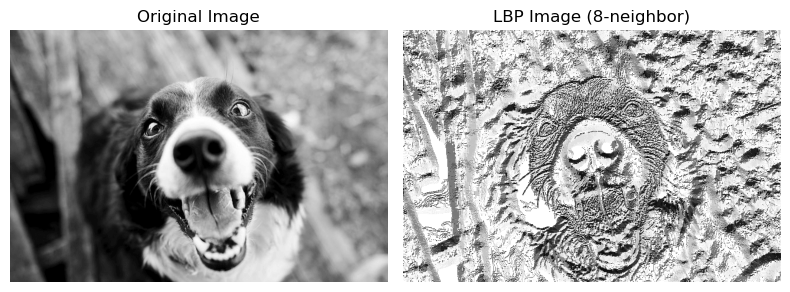

In [ ]:
# Load image
original_image = iio.imread("img/grayscale/img1.png")

# Convert to grayscale if RGB
if original_image.ndim == 3:
    original_image = np.dot(original_image[..., :3], [0.299, 0.587, 0.114])

# Compute LBP
lbp_image = compute_lbp(original_image)

# Plot Original and LBP images
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)
plt.imshow(original_image, cmap='gray')
plt.title("Original Image")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(lbp_image, cmap='gray')
plt.title("LBP Image (8-neighbor)")
plt.axis('off')

plt.tight_layout()
plt.show()


3. Write a Python function to compute the histogram of the LBP image.

In [ ]:
def lbp_histogram(lbp_image, normalize=True):
    """Compute the histogram of an 8-neighbor LBP image."""
    # Flatten image and compute histogram (256 bins for 8-bit LBP)
    hist, bins = np.histogram(lbp_image.ravel(), bins=256, range=(0, 256))
    
    # Optionally normalize the histogram
    if normalize:
        hist = hist.astype(np.float32)
        hist /= (hist.sum() + 1e-6)  # avoid division by zero

    return hist, bins

4. Plot the histogram and explain what it represents in terms of the texture features of the
image.

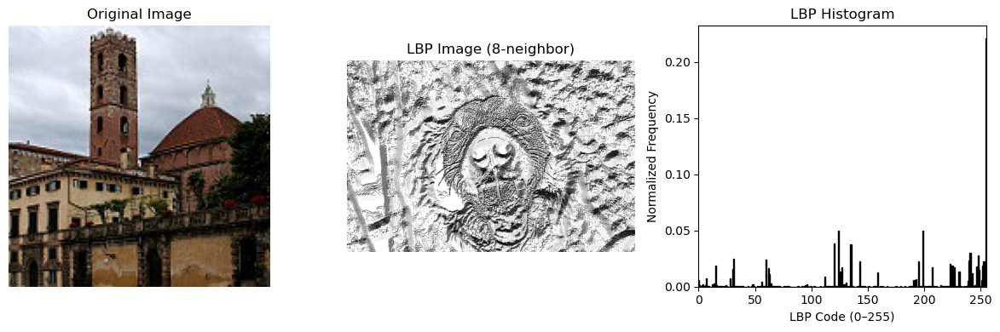

In [ ]:
# Compute histogram
hist, bins = lbp_histogram(lbp_image, normalize=True)

# Create subplot layout
fig, axes = plt.subplots(1, 3, figsize=(12, 4))

# Original image
axes[0].imshow(img, cmap='gray')
axes[0].set_title("Original Image")
axes[0].axis('off')

# LBP image
axes[1].imshow(lbp_image, cmap='gray')
axes[1].set_title("LBP Image (8-neighbor)")
axes[1].axis('off')

# LBP histogram
axes[2].bar(np.arange(256), hist, width=1, color='black', edgecolor='black')
axes[2].set_title("LBP Histogram")
axes[2].set_xlabel("LBP Code (0–255)")
axes[2].set_ylabel("Normalized Frequency")
axes[2].set_xlim(0, 255)

plt.tight_layout()
plt.show()


This LBP histogram shows a strong peak near code ≈ 255, meaning many pixels have neighborhoods where all surrounding pixels are brighter than or equal to the center — typical of smooth or uniform regions with little local contrast.

The smaller peaks scattered across other codes indicate occasional edges or small texture variations, but the dominance of the high-value bin suggests the image’s overall texture is mostly flat and homogeneous, with few distinct local patterns or edges.

5. Apply your LBP function to at least three different grayscale images (e.g., a natural scene, a
texture, and a face image).

In [ ]:
# Paths to images
folder_path = "img/lbp"

# List all files ending with .png in the folder, sorted alphabetically
images_paths = sorted(
    [os.path.join(folder_path, f) for f in os.listdir(folder_path) if f.endswith(".jpg")]
)

# Compute LBP for each image
images, lbps = [], []
for p in images_paths:
    im = iio.imread(p)
    if im.ndim == 3:
        im = np.dot(im[..., :3], [0.299, 0.587, 0.114])
    images.append(im)
    lbps.append(compute_lbp(im))

6. Generate and compare the histograms of the LBP images.

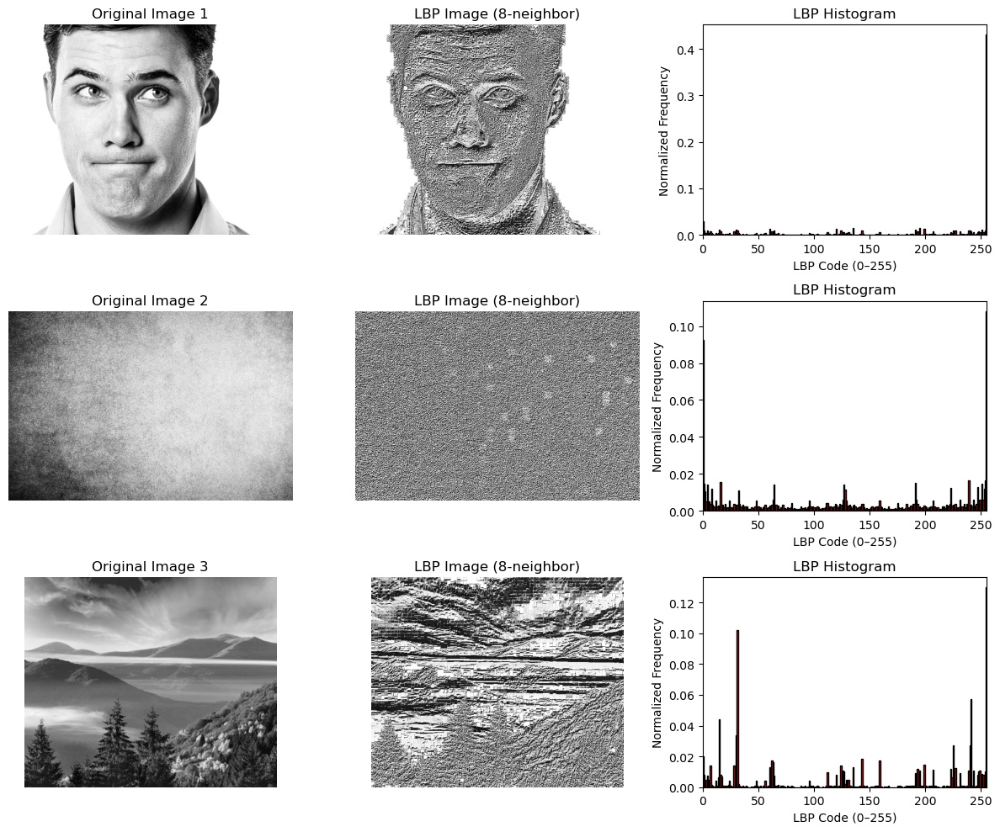

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(12, 10))

for row, p in enumerate(images_paths):
    # Load and convert to grayscale if needed
    img = iio.imread(p)
    if img.ndim == 3:
        img = np.dot(img[..., :3], [0.299, 0.587, 0.114])
    
    # Compute LBP and histogram
    lbp_image = compute_lbp(img)
    hist, bins = lbp_histogram(lbp_image, normalize=True)
   
    # Original image
    axes[row, 0].imshow(img, cmap='gray')
    axes[row, 0].set_title(f"Original Image {row + 1}")
    axes[row, 0].axis('off')
    
    # LBP image
    axes[row, 1].imshow(lbp_image, cmap='gray')
    axes[row, 1].set_title("LBP Image (8-neighbor)")
    axes[row, 1].axis('off')
    
    # Histogram
    axes[row, 2].bar(np.arange(256), hist, width=1, color='red', edgecolor='black')
    axes[row, 2].set_title("LBP Histogram")
    axes[row, 2].set_xlim(0, 255)
    axes[row, 2].set_xlabel("LBP Code (0–255)")
    axes[row, 2].set_ylabel("Normalized Frequency")
    
plt.tight_layout()
plt.show()


7. Discuss the differences in the histograms and what they tell you about the textures of the
different images.

The LBP histograms reveal clear differences in texture complexity across the three images. The first image (face) shows a dominant peak near the highest LBP code, indicating large smooth areas with limited local contrast—typical of uniform skin regions and soft shading. The second image (texture surface) has a more evenly distributed histogram with moderate variation, reflecting a fine, grainy texture with small but consistent intensity changes across the surface. In contrast, the third image (natural scene) exhibits multiple pronounced peaks spread across the LBP range, signifying a rich mix of edges, patterns, and structural variations found in landscapes with trees, mountains, and shadows. Overall, narrower histograms correspond to smoother, more uniform textures, while broader, multi-peaked distributions indicate rougher and more complex textures.

## Implement a blob detection algorithm

1. Apply the blob detection algorithm to one of the provided image datasets on blackborad.

2. Visualize the detected blobs on the original images, marking each detected blob with a
circle or bounding box.

3. Calculate and display relevant statistics for each image, such as the number of blobs
detected, their sizes, and positions.

4. Evaluate and discuss the effect of different parameters in the algorithms on the detection of
different blobs.

## Implement a contour detection algorithm.

1. Apply the contour detection algorithm to the same image dataset.

2. Visualize the detected contours on the original images, marking each contour with a
different color.

3. Calculate and display relevant statistics for each image, such as the number of contours
detected, contour area, and perimeter.

4. Compare the results of blob detection and contour detection for the chosen dataset.

5. Discuss the advantages and limitations of each technique.





6. Analyze the impact of different parameters (e.g., threshold values, filter sizes) on the
detection results.

7. Provide examples where one technique might be more suitable than the other.